In [1]:
using Arpack
using LinearAlgebra
using CairoMakie
using LaTeXStrings
using Statistics
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/concentrated_new/lattice_BZ.jl")
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/bc_sign_flip/rmg_spinors.jl")
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/bc_sign_flip/concentrated_spinors.jl")
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/bc_sign_flip/3dti_spinors.jl")
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/bc_sign_flip/patch_methods.jl")

spinor_inner (generic function with 1 method)

In [2]:
# general parameters
pd = 50
kappa = 1
w = 10^(-2) * kappa
spacing = 0.4 * (w / 2 / pd)

4.000000000000001e-5

<font size="12">RMG Comparison</font>

In [3]:
# RMG parameters
a = 4*pi/(3*kappa)
uD = 10
t0 = 3
t1 = 5
t2 = -0.21
t3 = 0
t4 = 0
Nl = 3

3

In [4]:
# 3-patch parameters
alpha = 1im
delta = -1
vF = 0

0

In [5]:
index = 1

1

In [6]:
function rmg_bc_comparison(pd, w, spacing, a, uD, t0, t1, t2, t3, t4, Nl, index, kappa, vF, delta, alpha)
    # get an mBZ centered at the kappa-point
    grid_sor = make_hex([kappa, 0], w / 2, w / 2 / pd)

    grid_patch = make_hex([0, 0], w / 2, w / 2 / pd)

    sor_bc = rmg_spinor_bc(grid_sor, spacing, a, uD, t0, t1, t2, t3, t4, Nl, index)
    patch_bc = rmg_patch_bc(grid_patch, spacing, a, uD, t0, t1, t2, t3, t4, Nl, index, kappa, vF, delta, alpha)

    fig = Figure(size=(2000, 800), fontsize=25)

    ax1 = Axis(fig[1, 1], title = L"\text{3-Patch } \Omega (\textbf{k})", xlabel = L"k_x", ylabel = L"k_y")
    tricontourf!(ax1, grid_patch[:, 1], grid_patch[:, 2], patch_bc, colormap = :Spectral)
    X, ax1, tr1 = tricontourf(grid_patch[:, 1], grid_patch[:, 2], patch_bc, colormap = :Spectral)
    cb1 = Colorbar(fig[1, 2], tr1)

    ax3 = Axis(fig[1, 3], title = L"\text{Spinor } \Omega (\textbf{k}) \text{ @ } \kappa", xlabel = L"k_x", ylabel = L"k_y")
    tricontourf!(ax3, grid_sor[:, 1], grid_sor[:, 2], sor_bc, colormap = :Spectral)
    X, ax3, tr3 = tricontourf(grid_sor[:, 1], grid_sor[:, 2], sor_bc, colormap = :Spectral)
    cb3 = Colorbar(fig[1, 4], tr3)

    fig
end

rmg_bc_comparison (generic function with 1 method)

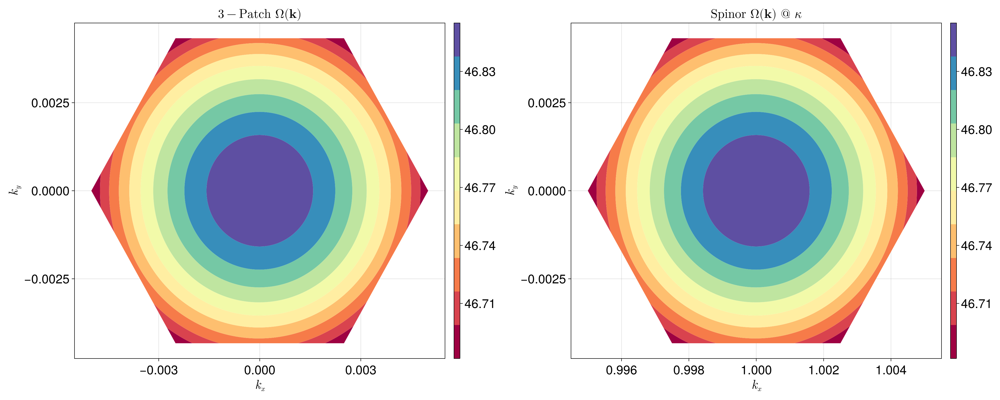

In [7]:
rmg_bc_comparison(pd, w, spacing, a, uD, t0, t1, t2, t3, t4, Nl, index, kappa, vF, delta, alpha)

In [8]:
function rmg_bc_contour_series(a, uD, t0, t1, t2, t3, t4, Nl, l, kappa, vF, delta, alpha_list, w, pd)
    grid = make_hex([0, 0], w / 2, w / 2 / pd)
    spacing = 0.4 * (w / 2 / pd)
    # create plot
    d1 = length(alpha_list)
    if d1 > 1
        fig = Figure(size=(1700, 300 * d1), fontsize=30)
    else
        fig = Figure(size=(1000, 800), fontsize=30)
    end
    index = 1
    for j in 1:d1
        alpha = alpha_list[j]
        curvatures = rmg_patch_bc(grid, spacing, a, uD, t0, t1, t2, t3, t4, Nl, l, kappa, vF, delta, alpha)

        id1 = index % 4
        ax1 = Axis(fig[Int(floor((j - 1) / 2)) + 1, id1], title = string(angle(alpha) / pi), xlabel = L"k_x", ylabel = L"k_y")
        tricontourf!(ax1, grid[:, 1], grid[:, 2], curvatures, colormap = :Spectral)
        X, ax1, tr1 = tricontourf(grid[:, 1], grid[:, 2], curvatures, colormap = :Spectral)
        cb1 = Colorbar(fig[Int(floor((j - 1) / 2)) + 1, id1 + 1], tr1)
        
        index += 2
    end
    ax = Axis(fig[:, :], title = L"k \text{ vs } \Omega", titlegap = 60)
    hidedecorations!(ax, label = false)
    hidespines!(ax)
    fig
end

rmg_bc_contour_series (generic function with 1 method)

In [9]:
# parameters
# alpha_list = (300) * [1, exp(pi/6 * im), exp(pi/3 * im), exp(pi/4 * im), exp(pi/2 * im), exp(2*pi/3 * im), exp(5*pi/6 * im), 
# exp(3*pi/4 * im), exp(pi * im), exp(4*pi/3 * im), exp(5*pi/3 * im), exp(3*pi/2 * im)]
alpha_list = 1im * [0, 10, 10^4, 10^8, 10^12]

5-element Vector{Complex{Int64}}:
 0 + 0im
 0 + 10im
 0 + 10000im
 0 + 100000000im
 0 + 1000000000000im

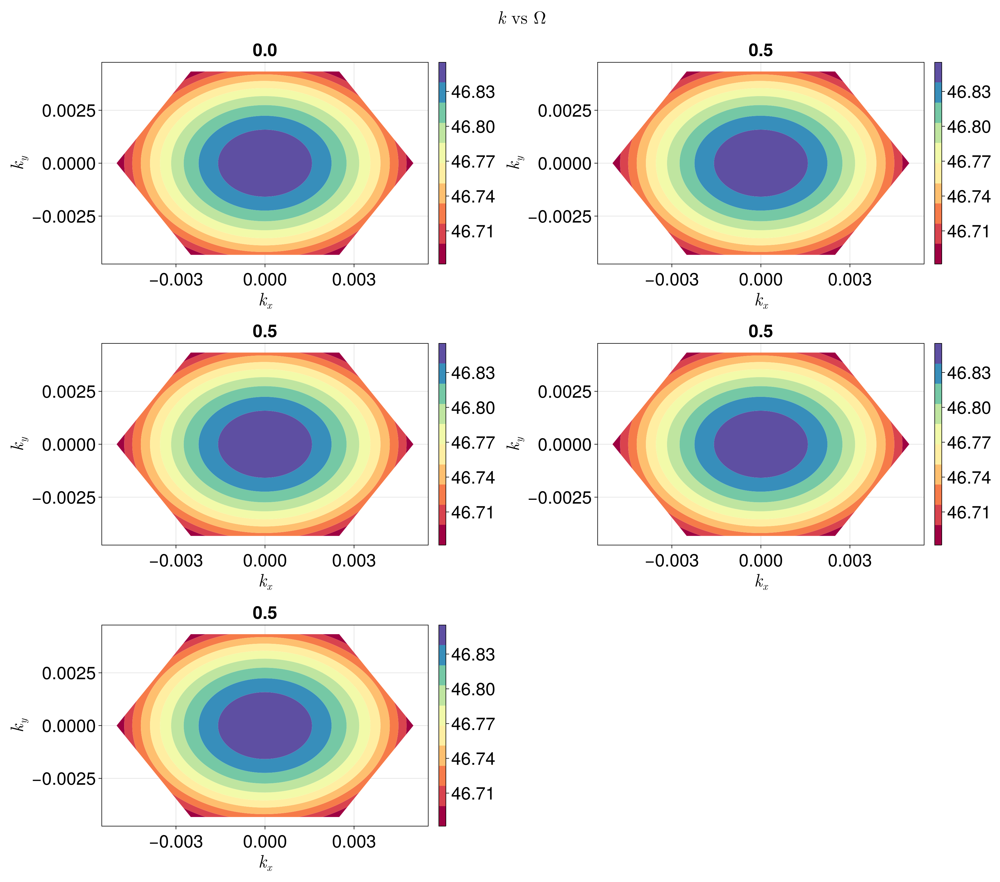

In [10]:
rmg_bc_contour_series(a, uD, t0, t1, t2, t3, t4, Nl, index, kappa, vF, delta, alpha_list, w, pd)

In [29]:
function rmg_bc_theta_series(a, uD, t0, t1, t2, t3, t4, Nl, l, kappa, vF, delta, alpha_list, w, p, pd)
    theta_list = range(0, 2*pi, 1000)
    curvature_ns = Array{Float64}(undef, length(theta_list))
    spacing = 0.4 * (w / 2 / pd)
    # create plot
    P = Figure(size=(3000, 2000), fontsize=30)
    for j in 1:length(alpha_list)
        alpha = alpha_list[j]
        for i in 1:length(theta_list)
            theta = theta_list[i]
            x = p * cos(theta)
            y = p * sin(theta)
            grid = reshape([x, y], (1, 2))
            curvature_ns[i] = rmg_patch_bc(grid, spacing, a, uD, t0, t1, t2, t3, t4, Nl, l, kappa, vF, delta, alpha)[1]
        end
        index = j % 3
        if j % 3 == 0
            index = 3
        end
        ax1 = Axis(P[Int(floor((j - 1) / 3)) + 1, index], title = string(imag(alpha)), xlabel = L"\theta", ylabel = L"\Omega")
        lines!(ax1, theta_list, curvature_ns)
    end
    ax = Axis(P[:, :], title = L"\theta \text{ vs } \Omega", titlegap = 60)
    hidedecorations!(ax, label = false)
    hidespines!(ax)
    P
end

rmg_bc_theta_series (generic function with 1 method)

In [61]:
# parameters
# alpha_list = (30) * [1, exp(pi/6 * im), exp(pi/3 * im), exp(pi/4 * im), exp(pi/2 * im), exp(2*pi/3 * im), exp(5*pi/6 * im), 
# exp(3*pi/4 * im), exp(pi * im), exp(4*pi/3 * im), exp(5*pi/3 * im), exp(3*pi/2 * im)]
alpha_list = exp(pi/2 * im) * [0, 10^5, 10^6, 10^8, 10^12]
p = 10^(-10)

1.0e-10

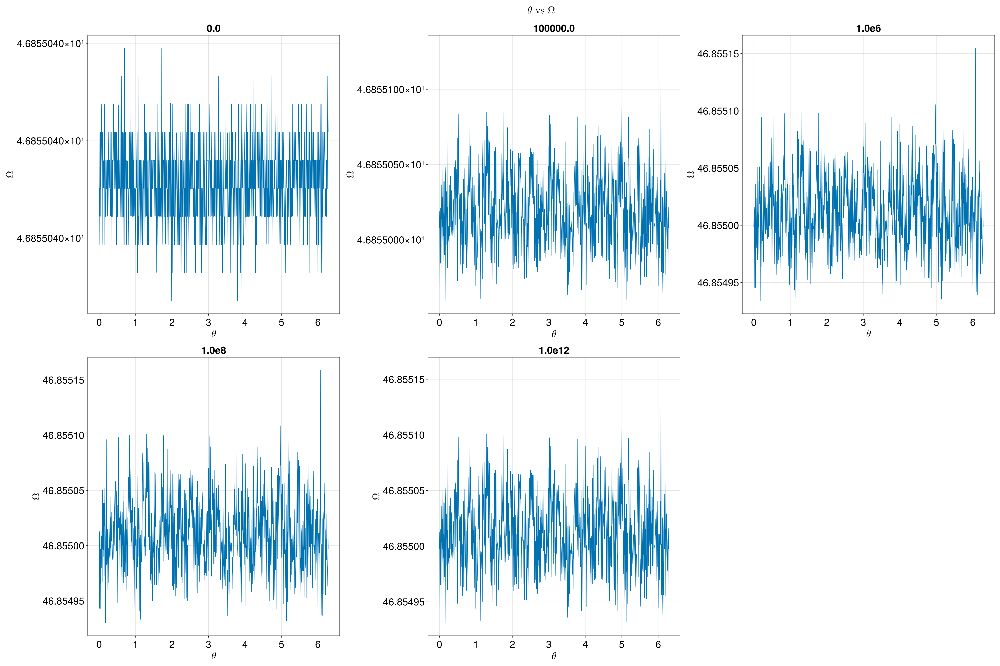

In [62]:
rmg_bc_theta_series(a, uD, t0, t1, t2, t3, t4, Nl, index, kappa, vF, delta, alpha_list, w, p, pd)

The following experiments serves to determine how twisting the phase angle and tuning of the magnitude of $\alpha$ affects the Berry curvature at the origin.

In [14]:
delta = -1

-1

In [93]:
function rmg_bc_mag_series(a, uD, t0, t1, t2, t3, t4, Nl, l, kappa, vF, delta, alpha_list, w, p, pd)
    # alpha_mags = range(0, 10^4, 1000)
    curvature_ns = Array{Float64}(undef, length(alpha_list))
    spacing = 10^(-4) * (w / 2 / pd)
    x = 10^(-12)
    y = 10^(-12)
    grid = reshape([x, y], (1, 2))
    # create plot
    P = Figure(size=(2000, 1000), fontsize=30)
    for j in 1:length(alpha_list)
        alpha = alpha_list[j] * exp(pi/5 * im)
        curvature_ns[j] = rmg_patch_bc(grid, spacing, a, uD, t0, t1, t2, t3, t4, Nl, l, kappa, vF, delta, alpha)[1]
    end
    ax1 = Axis(P[1, 1], xlabel = L"|\alpha|", ylabel = L"\Omega(0, 0)")
    lines!(ax1, alpha_list, curvature_ns)
    P
end

rmg_bc_mag_series (generic function with 1 method)

In [94]:
# alpha_phases = [-pi/2, 0, pi/2, pi]
alpha_list = range(-10^10, 10^10, 10^3)

-1.0e10:2.002002002002002e7:1.0e10

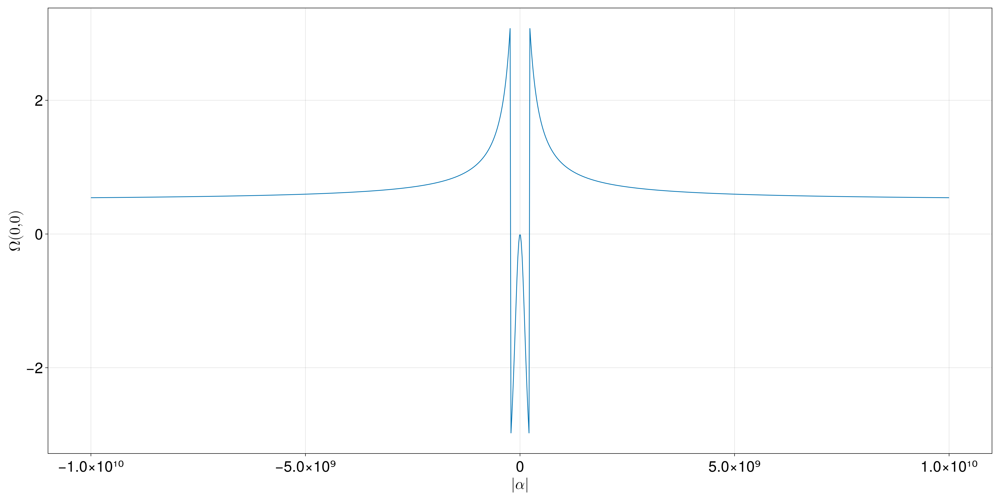

In [95]:
rmg_bc_mag_series(a, uD, t0, t1, t2, t3, t4, Nl, index, kappa, vF, delta, alpha_list, w, p, pd)

In [18]:
function rmg_bc_alpha_exp1(a, uD, t0, t1, t2, t3, t4, Nl, l, kappa, vF, delta, w, pd, k)
    spacing = 10^(-5) * (w / 2 / pd)
    # create plot
    fig = Figure(size=(900, 800), fontsize=30)
    grid = reshape(k, (1, 2))

    grid_sor = reshape([kappa + k[1], 0 + k[2]], (1, 2))
    sor_bc = rmg_spinor_bc(grid_sor, spacing, a, uD, t0, t1, t2, t3, t4, Nl, l)[1]

    alpha_phases = range(0, 2 * pi, pd)
    alpha_mags = range(0, 10^3, pd)

    # make alpha mesh-grid
    alpha_grid = Array{Float64}(undef, pd^2, 2)
    counter = 1
    for i in 1:pd
        for j in 1:pd
            alpha_grid[counter, 1] = alpha_phases[i]
            alpha_grid[counter, 2] = alpha_mags[j]
            counter += 1
        end
    end

    delta_curvature = Array{Float64}(undef, pd^2)
    for j in 1:pd^2
        t_alpha = alpha_grid[j, 2] * exp(alpha_grid[j, 1] * im)
        temp_c = rmg_patch_bc(grid, spacing, a, uD, t0, t1, t2, t3, t4, Nl, l, kappa, vF, delta, t_alpha)[1]
        delta_curvature[j] = sor_bc - temp_c
    end

    ax1 = Axis(fig[1, 1], title = L"\Omega_{RMG}(\textbf{\kappa_1}) - \Omega_{3P}(0, 0)", xlabel = L"\frac{1}{\pi} arg(\alpha)", 
    ylabel = L"|\alpha|")
    tricontourf!(ax1, alpha_grid[:, 1] ./ pi, alpha_grid[:, 2], delta_curvature, colormap = :Spectral)
    X, ax1, tr1 = tricontourf(alpha_grid[:, 1] ./ pi, alpha_grid[:, 2], delta_curvature, colormap = :Spectral)
    cb1 = Colorbar(fig[1, 2], tr1)

    fig
end

rmg_bc_alpha_exp1 (generic function with 1 method)

In [19]:
delta = -1

-1

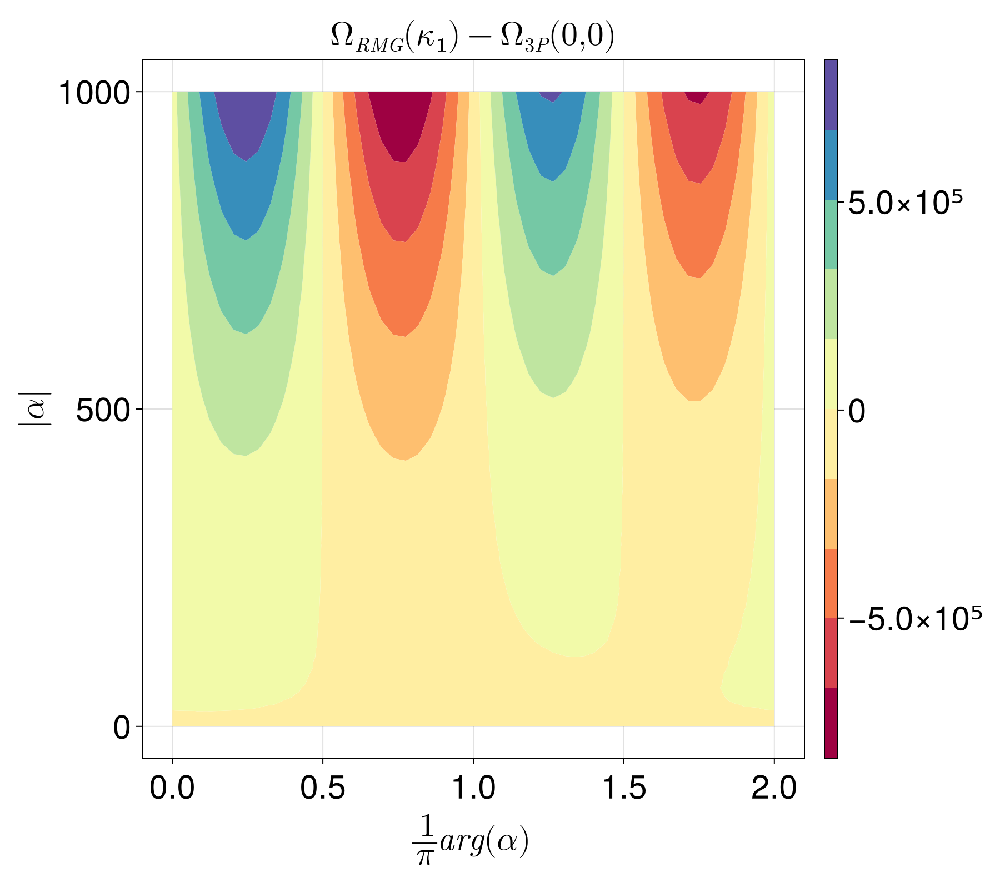

In [20]:
rmg_bc_alpha_exp1(a, uD, t0, t1, t2, t3, t4, Nl, index, kappa, vF, delta, w, pd, [0, 0])

<font size="12">Concentrated Comparison</font>

In [21]:
# 3-patch parameters
alpha = 0
delta = -1
vF = 0

0

In [22]:
n = 1
w = 10^(-1) * kappa
pd = 50
spacing = 0.4 * (w / 2 / pd)

0.0004

In [23]:
function concentrated_bc_comparison(pd, w, spacing, n, kappa, vF, delta, alpha)
    # get an mBZ centered at the kappa-point
    grid_sor = make_hex([0, 0], 3, 3 / pd)
    grid_patch = make_hex([0, 0], w / 2, w / 2 / pd)

    sor_bc = concentrated_spinor_bc(grid_sor, spacing, n, w)
    patch_bc = concentrated_patch_bc(grid_patch, spacing, n, w, kappa, vF, delta, alpha)

    fig = Figure(size=(1700, 600), fontsize=25)

    ax1 = Axis(fig[1, 1], title = L"\text{3-Patch } \Omega (\textbf{k})", xlabel = L"k_x", ylabel = L"k_y")
    tricontourf!(ax1, grid_patch[:, 1], grid_patch[:, 2], patch_bc, colormap = :Spectral)
    X, ax1, tr1 = tricontourf(grid_patch[:, 1], grid_patch[:, 2], patch_bc, colormap = :Spectral)
    cb1 = Colorbar(fig[1, 2], tr1)

    ax3 = Axis(fig[1, 3], title = L"\text{Spinor } \Omega (\textbf{k})", xlabel = L"k_x", ylabel = L"k_y")
    tricontourf!(ax3, grid_sor[:, 1], grid_sor[:, 2], sor_bc, colormap = :Spectral)
    X, ax3, tr3 = tricontourf(grid_sor[:, 1], grid_sor[:, 2], sor_bc, colormap = :Spectral)
    cb3 = Colorbar(fig[1, 4], tr3)

    fig
end

concentrated_bc_comparison (generic function with 1 method)

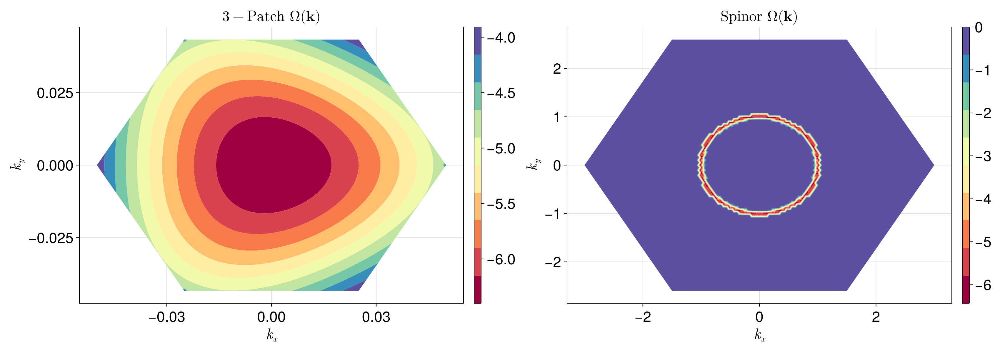

In [24]:
concentrated_bc_comparison(pd, w, spacing, n, kappa, vF, delta, alpha)

In [25]:
function concentrated_bc_contour_series(n, kappa, vF, delta, alpha_list, w, pd)
    grid = make_hex([0, 0], w / 2, w / 2 / pd)
    spacing = 0.4 * (w / 2 / pd)
    # create plot
    d1 = length(alpha_list)
    fig = Figure(size=(1700, 300 * d1), fontsize=30)
    index = 1
    for j in 1:d1
        alpha = alpha_list[j]
        curvatures = concentrated_patch_bc(grid, spacing, n, w, kappa, vF, delta, alpha)

        id1 = index % 4
        ax1 = Axis(fig[Int(floor((j - 1) / 2)) + 1, id1], title = string(angle(alpha) / pi), xlabel = L"k_x", ylabel = L"k_y")
        tricontourf!(ax1, grid[:, 1], grid[:, 2], curvatures, colormap = :Spectral)
        X, ax1, tr1 = tricontourf(grid[:, 1], grid[:, 2], curvatures, colormap = :Spectral)
        cb1 = Colorbar(fig[Int(floor((j - 1) / 2)) + 1, id1 + 1], tr1)
        
        index += 2
    end
    ax = Axis(fig[:, :], title = L"k \text{ vs } \Omega", titlegap = 60)
    hidedecorations!(ax, label = false)
    hidespines!(ax)
    fig
end

concentrated_bc_contour_series (generic function with 1 method)

In [26]:
# parameters
# alpha_list = (30) * [1, exp(pi/6 * im), exp(pi/3 * im), exp(pi/4 * im), exp(pi/2 * im), exp(2*pi/3 * im), exp(5*pi/6 * im), 
# exp(3*pi/4 * im), exp(pi * im), exp(4*pi/3 * im), exp(5*pi/3 * im), exp(3*pi/2 * im)]
alpha_list = 1im * [-1000, -100, -10, -1, 0, 1, 10, 100, 1000]

9-element Vector{Complex{Int64}}:
 0 - 1000im
 0 - 100im
 0 - 10im
 0 - 1im
 0 + 0im
 0 + 1im
 0 + 10im
 0 + 100im
 0 + 1000im

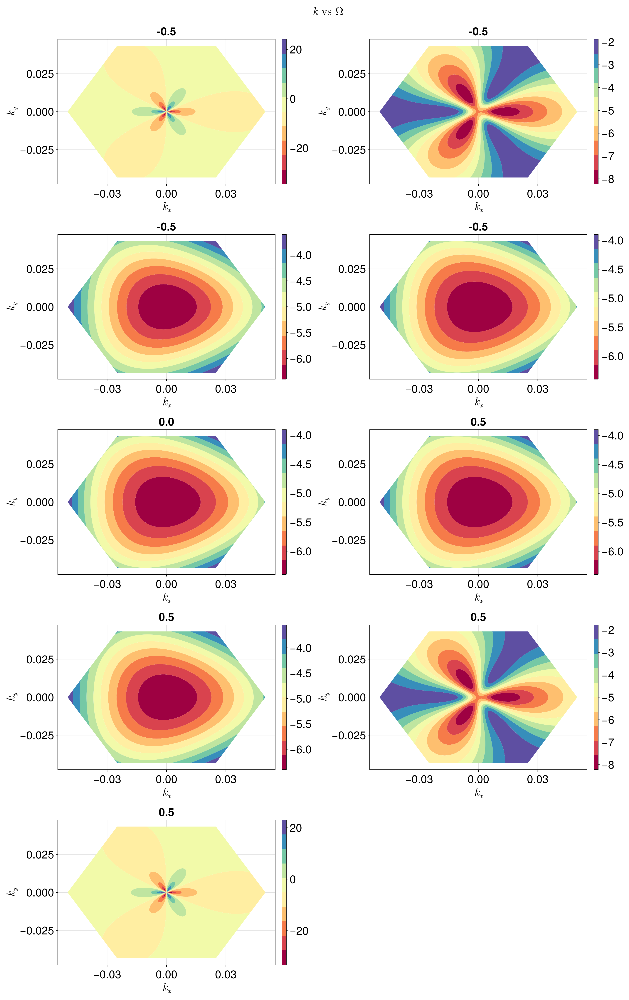

In [27]:
concentrated_bc_contour_series(n, kappa, vF, delta, alpha_list, w, pd)

In [28]:
function concentrated_bc_theta_series(n, kappa, vF, delta, alpha_list, w, p, pd)
    theta_list = range(0, 2 * pi, 100)
    curvatures = Array{Float64}(undef, length(theta_list))
    spacing = 0.4 * (w / 2 / pd)
    # create plot
    P = Figure(size=(2000, 1000), fontsize=30)
    for j in 1:length(alpha_list)
        alpha = alpha_list[j]
        for i in 1:length(theta_list)
            theta = theta_list[i]
            x = p * cos(theta)
            y = p * sin(theta)
            grid = reshape([x, y], (1, 2))
            curvatures[i] = concentrated_patch_bc(grid, spacing, n, w, kappa, vF, delta, alpha)[1]
        end
        index = j % 3
        if j % 3 == 0
            index = 3
        end
        ax1 = Axis(P[Int(floor((j - 1) / 3)) + 1, index], title = string(angle(alpha) / pi), xlabel = L"\theta", ylabel = L"\Omega")
        lines!(ax1, theta_list, curvatures)
    end
    ax = Axis(P[:, :], title = L"\theta \text{ vs } \Omega", titlegap = 60)
    hidedecorations!(ax, label = false)
    hidespines!(ax)
    P
end

concentrated_bc_theta_series (generic function with 1 method)

In [29]:
# parameters
alpha_list = (30) * [1, exp(pi / 6 * im), exp(pi / 3 * im), exp(pi / 4 * im), exp(pi / 2 * im), exp(2 * pi / 3 * im), exp(5 * pi / 6 * im), 
exp(3 * pi / 4 * im), exp(pi * im), exp(4 * pi / 3 * im), exp(5 * pi / 3 * im), exp(3 * pi / 2 * im)]
p = w / 4

0.025

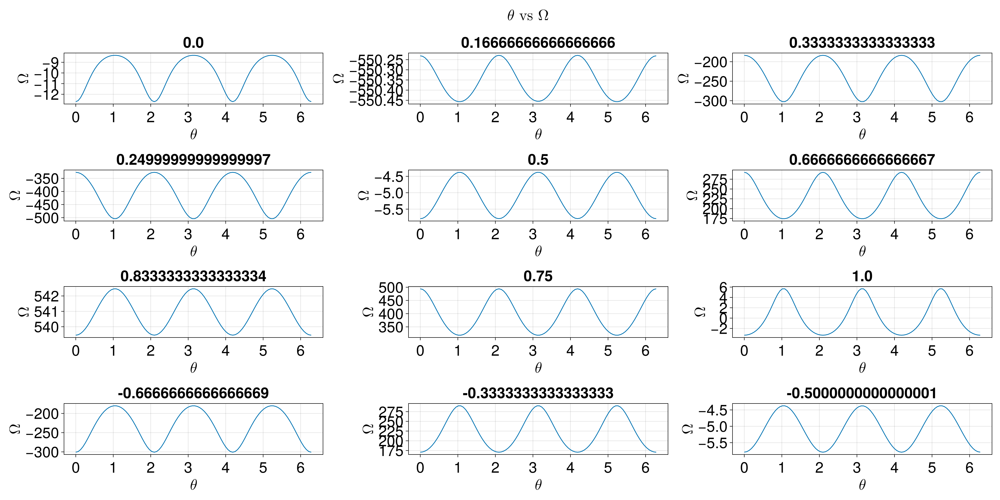

In [30]:
concentrated_bc_theta_series(n, kappa, vF, delta, alpha_list, w, p, pd)

In [31]:
function concentrated_bc_alpha_exp1(n, kappa, vF, delta, w, pd, k)
    spacing = 0.4 * (w / 2 / pd)
    # create plot
    fig = Figure(size=(900, 800), fontsize=30)
    grid = reshape(k, (1, 2))

    grid_sor = reshape([kappa + k[1], 0 + k[2]], (1, 2))
    sor_bc = concentrated_spinor_bc(grid_sor, spacing, n, w)[1]

    alpha_phases = range(0, 2 * pi, pd)
    alpha_mags = range(0, 10^3, pd)

    # make alpha mesh-grid
    alpha_grid = Array{Float64}(undef, pd^2, 2)
    counter = 1
    for i in 1:pd
        for j in 1:pd
            alpha_grid[counter, 1] = alpha_phases[i]
            alpha_grid[counter, 2] = alpha_mags[j]
            counter += 1
        end
    end

    delta_curvature = Array{Float64}(undef, pd^2)
    for j in 1:pd^2
        t_alpha = alpha_grid[j, 2] * exp(alpha_grid[j, 1] * im)
        temp_c = concentrated_patch_bc(grid, spacing, n, w, kappa, vF, delta, t_alpha)[1]
        delta_curvature[j] = sor_bc - temp_c
    end

    ax1 = Axis(fig[1, 1], title = L"\Omega_{con.}(\textbf{\kappa_1}) - \Omega_{3P}(0, 0)", xlabel = L"\frac{1}{\pi}arg(\alpha)", 
    ylabel = L"|\alpha|")
    tricontourf!(ax1, alpha_grid[:, 1] ./ pi, alpha_grid[:, 2], log10.(abs.(delta_curvature)), colormap = :Spectral)
    X, ax1, tr1 = tricontourf(alpha_grid[:, 1] ./ pi, alpha_grid[:, 2], log10.(abs.(delta_curvature)), colormap = :Spectral)
    cb1 = Colorbar(fig[1, 2], tr1)

    fig
end

concentrated_bc_alpha_exp1 (generic function with 1 method)

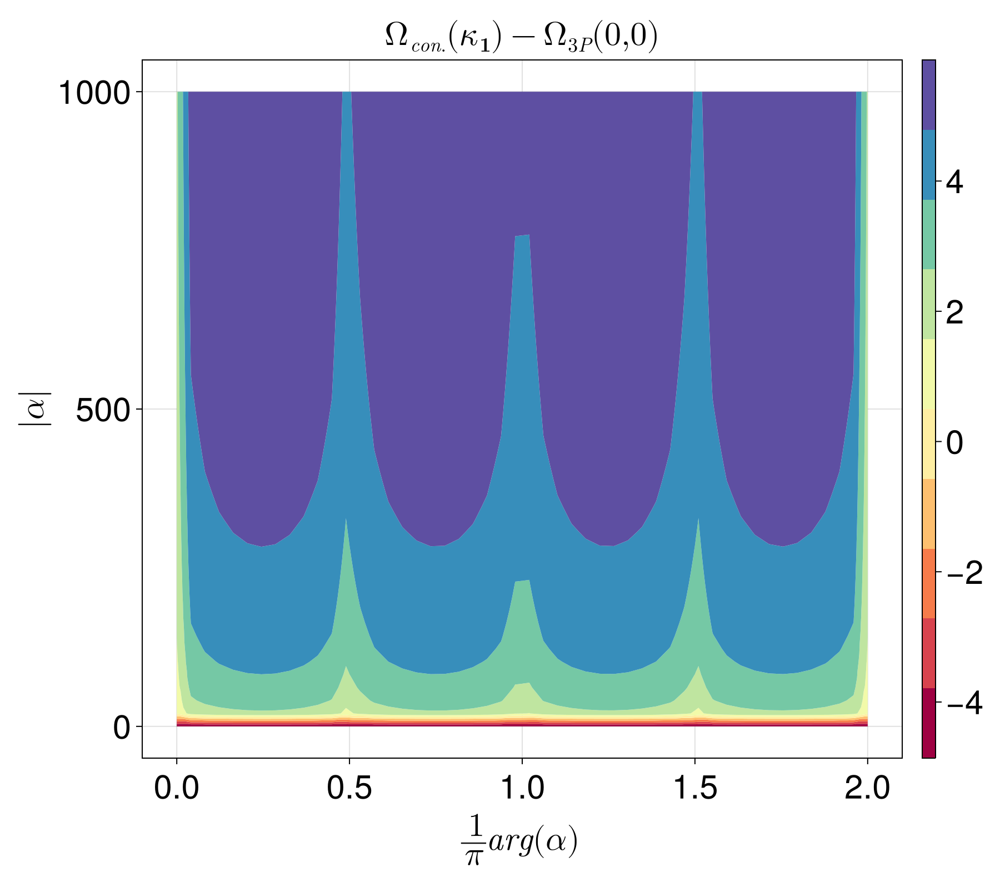

In [32]:
concentrated_bc_alpha_exp1(n, kappa, vF, delta, w, pd, [0, 0])

<font size="12">3D TI Comparison</font>

In [99]:
# general parameters
pd = 50
kappa = 1
w = 10^(-2) * kappa
spacing = 0.4 * (w / 2 / pd)

4.000000000000001e-5

In [100]:
# 3-patch parameters
alpha = 1im
delta = -1
vF = 0

0

In [101]:
v_F = 0.5
hbar = 1
m = -1
index = 1

1

In [102]:
function ti_bc_comparison(pd, w, spacing, hbar, v_F, m, index, kappa, vF, delta, alpha)
    grid_sor = make_hex([0, 0], w / 2, w / 2 / pd)

    grid_patch = make_hex([0, 0], w / 2, w / 2 / pd)

    sor_bc = ti_spinor_bc(grid_sor, spacing, hbar, v_F, m, index)
    patch_bc = ti_patch_bc(grid_patch, spacing, hbar, v_F, m, index, kappa, vF, delta, alpha)

    fig = Figure(size=(1700, 600), fontsize=25)

    ax1 = Axis(fig[1, 1], title = L"\text{3-Patch } \Omega (\textbf{k})", xlabel = L"k_x", ylabel = L"k_y")
    tricontourf!(ax1, grid_patch[:, 1], grid_patch[:, 2], patch_bc, colormap = :Spectral)
    X, ax1, tr1 = tricontourf(grid_patch[:, 1], grid_patch[:, 2], patch_bc, colormap = :Spectral)
    cb1 = Colorbar(fig[1, 2], tr1)

    ax3 = Axis(fig[1, 3], title = L"\text{Spinor } \Omega (\textbf{k})", xlabel = L"k_x", ylabel = L"k_y")
    tricontourf!(ax3, grid_sor[:, 1], grid_sor[:, 2], sor_bc, colormap = :Spectral)
    X, ax3, tr3 = tricontourf(grid_sor[:, 1], grid_sor[:, 2], sor_bc, colormap = :Spectral)
    cb3 = Colorbar(fig[1, 4], tr3)

    fig
end

ti_bc_comparison (generic function with 1 method)

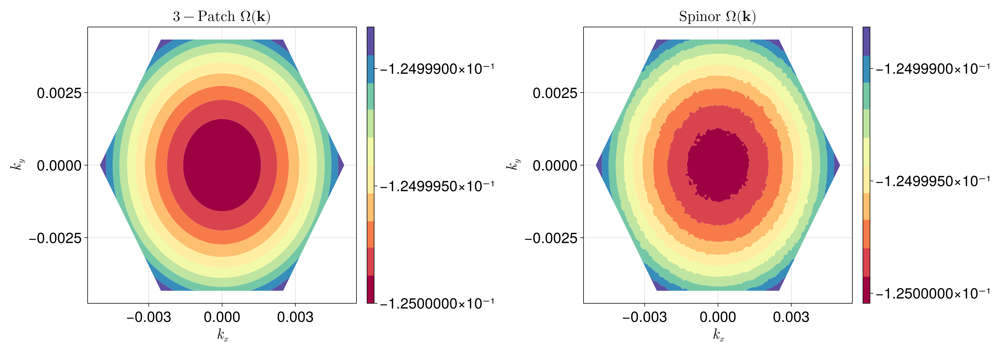

In [103]:
ti_bc_comparison(pd, w, spacing, hbar, v_F, m, index, kappa, vF, delta, alpha)

In [104]:
# parameters
# alpha_list = (30) * [1, exp(pi / 6 * im), exp(pi / 3 * im), exp(pi / 4 * im), exp(pi / 2 * im), exp(2 * pi / 3 * im), exp(5 * pi / 6 * im), 
# exp(3 * pi / 4 * im), exp(pi * im), exp(4 * pi / 3 * im), exp(5 * pi / 3 * im), exp(3 * pi / 2 * im)]
alpha_list = 1im * [-10^8, 100, -10, -1, 0, 1, 10, 100, 10^8]

9-element Vector{Complex{Int64}}:
 0 - 100000000im
 0 + 100im
 0 - 10im
 0 - 1im
 0 + 0im
 0 + 1im
 0 + 10im
 0 + 100im
 0 + 100000000im

In [105]:
function ti_bc_contour_series(hbar, v_F, m, l, kappa, vF, delta, alpha_list, w, pd)
    grid = make_hex([0, 0], w / 2, w / 2 / pd)
    spacing = 0.4 * (w / 2 / pd)
    # create plot
    d1 = length(alpha_list)
    fig = Figure(size=(1700, 300 * d1), fontsize=30)
    index = 1
    for j in 1:d1
        alpha = alpha_list[j]
        curvatures = ti_patch_bc(grid, spacing, hbar, v_F, m, l, kappa, vF, delta, alpha)

        id1 = index % 4
        ax1 = Axis(fig[Int(floor((j - 1) / 2)) + 1, id1], title = string(angle(alpha) / pi), xlabel = L"k_x", ylabel = L"k_y")
        tricontourf!(ax1, grid[:, 1], grid[:, 2], curvatures, colormap = :Spectral)
        X, ax1, tr1 = tricontourf(grid[:, 1], grid[:, 2], curvatures, colormap = :Spectral)
        cb1 = Colorbar(fig[Int(floor((j - 1) / 2)) + 1, id1 + 1], tr1)
        
        index += 2
    end
    ax = Axis(fig[:, :], title = L"k \text{ vs } \Omega", titlegap = 60)
    hidedecorations!(ax, label = false)
    hidespines!(ax)
    fig
end

ti_bc_contour_series (generic function with 1 method)

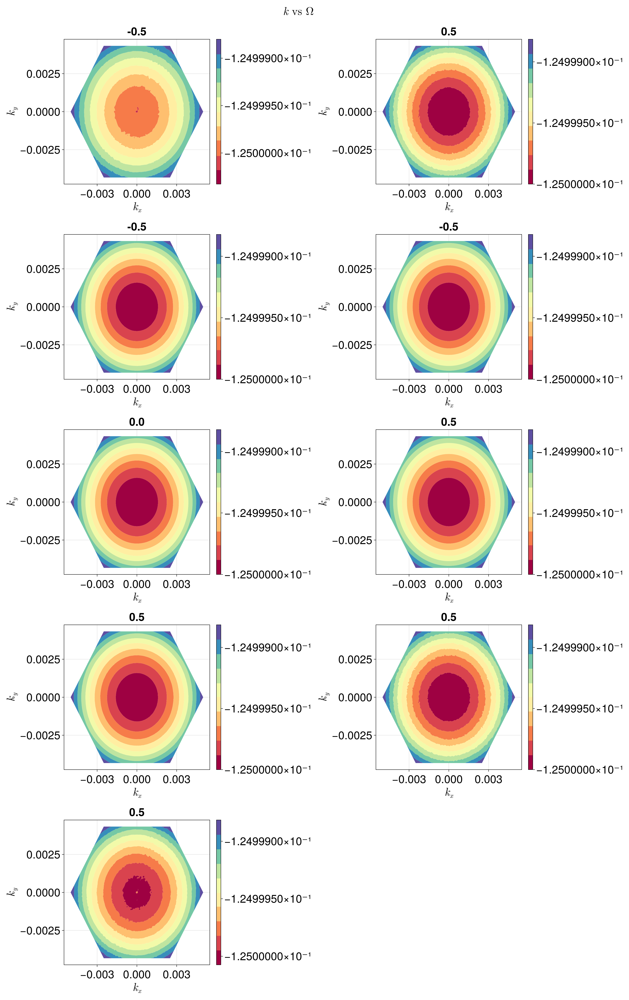

In [106]:
ti_bc_contour_series(hbar, v_F, m, index, kappa, vF, delta, alpha_list, w, pd)

In [41]:
function ti_bc_theta_series(hbar, v_F, m, l, kappa, vF, delta, alpha_list, w, p, pd)
    theta_list = range(0, 2 * pi, 1000)
    curvature_ns = Array{Float64}(undef, length(theta_list))
    # create plot
    P = Figure(size=(2000, 1000), fontsize=30)
    for j in 1:length(alpha_list)
        alpha = alpha_list[j]
        for i in 1:length(theta_list)
            theta = theta_list[i]
            x = p * cos(theta)
            y = p * sin(theta)
            spacing = 10^(-1) * (p * kappa / pd)
            grid = reshape([x, y], (1, 2))
            curvature_ns[i] = ti_patch_bc(grid, spacing, hbar, v_F, m, l, kappa, vF, delta, alpha)[1]
        end
        index = j % 3
        if j % 3 == 0
            index = 3
        end
        ax1 = Axis(P[Int(floor((j - 1) / 3)) + 1, index], title = string(alpha), xlabel = L"\theta", ylabel = L"\Omega")
        lines!(ax1, theta_list, curvature_ns)
    end
    ax = Axis(P[:, :], title = L"\theta \text{ vs } \Omega \text{ for } \Delta = -1", titlegap = 60)
    hidedecorations!(ax, label = false)
    hidespines!(ax)
    P
end

ti_bc_theta_series (generic function with 1 method)

In [42]:
# parameters
alpha_list = (30) * [1, exp(pi / 6 * im), exp(pi / 3 * im), exp(pi / 4 * im), exp(pi / 2 * im), exp(2 * pi / 3 * im), exp(5 * pi / 6 * im), 
exp(3 * pi / 4 * im), exp(pi * im), exp(4 * pi / 3 * im), exp(5 * pi / 3 * im), exp(3 * pi / 2 * im)]
p = w / 4

0.0025000000000000005

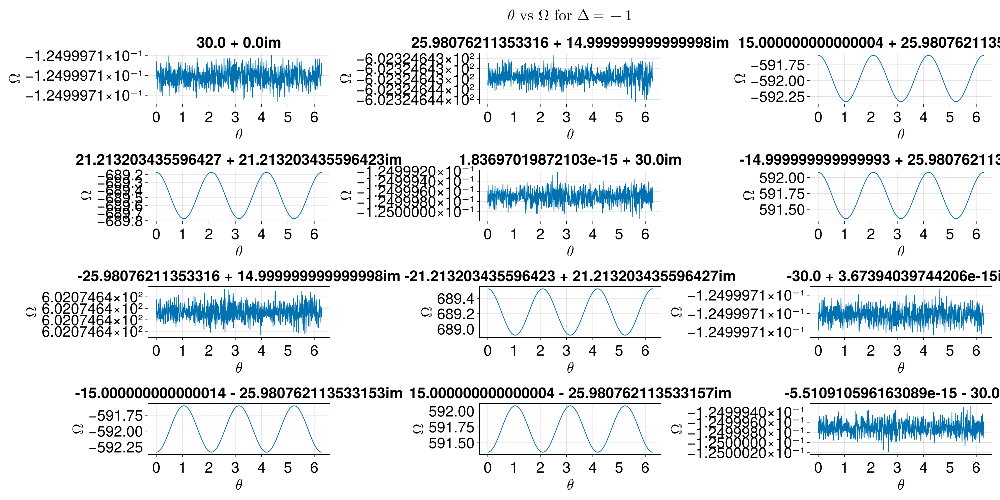

In [43]:
ti_bc_theta_series(hbar, v_F, m, index, kappa, vF, delta, alpha_list, w, p, pd)